# Демо-экзамен по курсу "Прикладной анализ данных". Вариант 1

Выполнил: Донецков Андрей Дмитриевич Б23-215

Название ВУЗа, в котором обучаетесь: НИЯУ МИФИ

Вставьте ниже скриншот с результатом вашего решения в Leaderboard на Kaggle: https://www.kaggle.com/competitions/where-are-the-seagulls

*Пример ниже:*

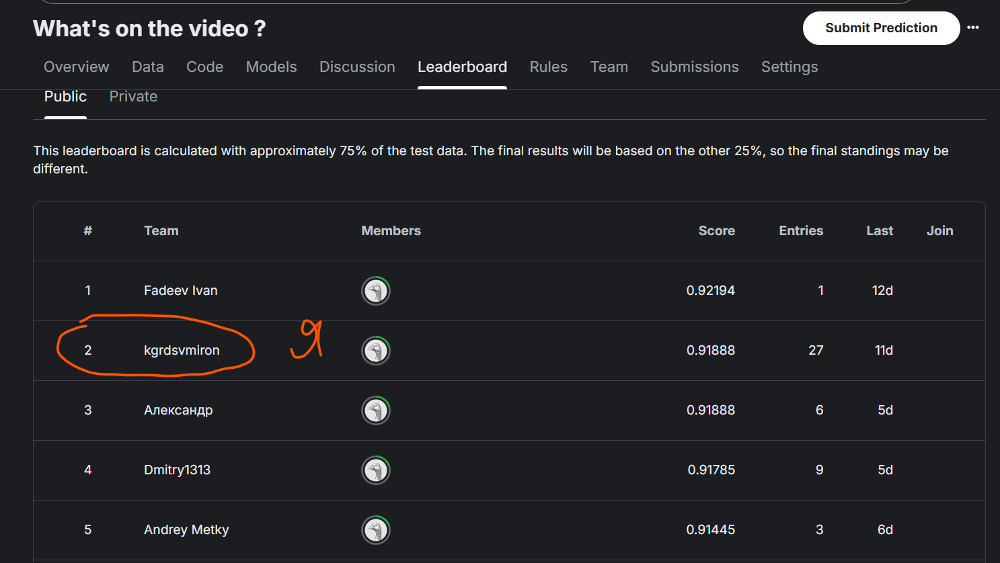

## 0. Описание задачи и данные

В 4 километрах от тихоокеанского берега Камчатки в бухте Вестник лежит остров Уташуд — часть Южно-Камчатского федерального заказника. На нем живут каланы, антуры, тюлени ларги, около 50 тысяч птиц десяти разных видов, включая  колонию топорика численностью 10 тыс. пар. В данной задаче нас интересуют двое обитатаелей острова – ларга и техоокеанская чайка, за которыми осуществляется наблюдение через фотоловушки в летний сезон.

На Уташуде находится репродуктивное лежбище тюленей-ларга  и одно из крупнейших на Камчатке поселений тихоокеанской чайки (4 тыс. пар). За 1 сезон наблюдения за этими животными может накопится более 1800 фотографий различного качества. Через эти фотографии инспекторы оценивают благополучие и численность животных.

Разработайте алгоритм, который бы позволил производить учет чаек и выделять их по фотографии.

Ссылка на соревнование и на данные: https://www.kaggle.com/competitions/where-are-the-seagulls

In [4]:
# Import libraries
# TODO

import os
import shutil
import random
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import cv2


Небольшая инструкция как напрямую скачать данные с kaggle в Colab ноутбук: https://www.geeksforgeeks.org/python/how-to-import-kaggle-datasets-directly-into-google-colab/

In [5]:
import opendatasets as od

url = 'https://www.kaggle.com/competitions/where-are-the-seagulls'
od.download(url)

Skipping, found downloaded files in "./where-are-the-seagulls" (use force=True to force download)


Создаем тренировучную и валидационную выборку из **train**

Воспользуемся следующей структурой:
```
data/
├── all_data/
│   ├── images/
│   └── labels/
└── test/
    └── images/
```

In [6]:
# os.makedirs("where-are-the-seagulls/data/train", exist_ok=True)
# shutil.move("where-are-the-seagulls/data/train", "where-are-the-seagulls/data/all_data")

In [7]:
train_images_path = "where-are-the-seagulls/data/all_data/images/"
train_labels_path = "where-are-the-seagulls/data/all_data/labels/"
test_images_path = "where-are-the-seagulls/data/test/images/"

train_images_path_array = [train_images_path + entry.name for entry in os.scandir(train_images_path) if entry.is_file()]
train_labels_path_array = [train_labels_path + entry.name for entry in os.scandir(train_labels_path) if entry.is_file()]
test_images_path_array = [test_images_path + entry.name for entry in os.scandir(test_images_path) if entry.is_file()]

In [8]:
combined_list = []

for label_path in train_labels_path_array:
    if os.path.getsize(label_path) > 0:
        temp_df = pd.read_csv(label_path, header=None, sep='\s+')
        temp_df['file_name'] = label_path
        combined_list.append(temp_df)

label_df = pd.concat(combined_list, ignore_index=True)
label_df.columns = ['label', 'x_center', 'y_center', 'width', 'height', 'file_name']
label_df = label_df[['file_name', 'label', 'x_center', 'y_center', 'width', 'height']]

<>:5: SyntaxWarning: invalid escape sequence '\s'
<>:5: SyntaxWarning: invalid escape sequence '\s'
/tmp/ipykernel_58689/3944526556.py:5: SyntaxWarning: invalid escape sequence '\s'
  temp_df = pd.read_csv(label_path, header=None, sep='\s+')


## 1. Провести предварительное исследование данных

- в каком формате вам предоставлены данные?
- какие есть особенности датасета?
- если необходимо произвести очистку и предварительную обработку данных.

### Глянем на соотношения.

In [9]:
print(len(train_images_path_array), len(test_images_path_array))

500 99


Можно и проще сделать вручную. Ну да ладно.

### Визуализируем ограничивающие прямоугольники.

In [10]:
# Посмотреть на изображения из папки
def look_images(imgage_path: str, resolutin: list) -> None:
    import imgviz

    num_samples = min(resolutin[0] * resolutin[1], len(imgage_path))
    sampled_paths = random.sample(imgage_path, num_samples)

    fig, axes = plt.subplots(resolutin[1], resolutin[0], figsize=(resolutin[0] * 4, resolutin[1] * 4))
    axes_flat = axes.flat

    for idx, ax in enumerate(axes_flat):
        if idx < num_samples:
            image = cv2.imread(sampled_paths[idx])
            image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
            ax.imshow(image_rgb)
            ax.axis('off')
        else:
            ax.axis('off')

    plt.tight_layout()
    plt.show()

Посмотрим на 15 изображений из **train**.

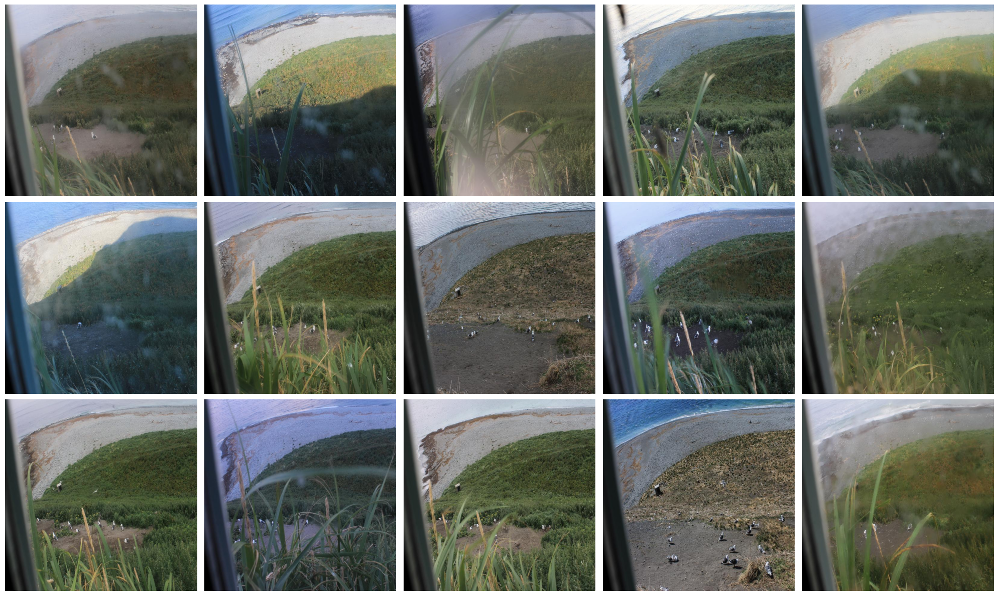

In [11]:
look_images(train_images_path_array, [5, 3])

Посмотрим на 15 изображений из **test**.

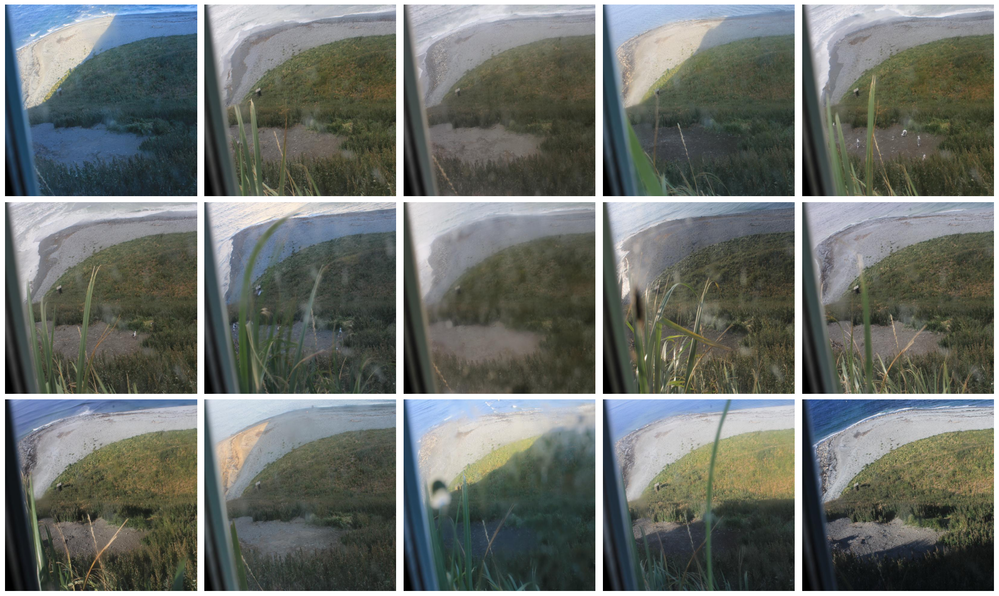

In [12]:
look_images(test_images_path_array, [5, 3])

Видно только чаек, где тюлени?

In [13]:
label_df

,file_name,label,x_center,y_center,width,height
0,where-are-the-seagulls/data/all_data/labels/20...,0,0.178125,0.648438,0.017188,0.032031
1,where-are-the-seagulls/data/all_data/labels/20...,0,0.178906,0.678906,0.029687,0.029687
2,where-are-the-seagulls/data/all_data/labels/20...,0,0.290625,0.697656,0.035937,0.028125
3,where-are-the-seagulls/data/all_data/labels/20...,0,0.364063,0.663281,0.027344,0.037500
4,where-are-the-seagulls/data/all_data/labels/20...,0,0.406250,0.771094,0.023438,0.066406
...,...,...,...,...,...,...
5381,where-are-the-seagulls/data/all_data/labels/20...,0,0.657813,0.666406,0.022656,0.058594
5382,where-are-the-seagulls/data/all_data/labels/20...,0,0.523438,0.721094,0.029687,0.050781
5383,where-are-the-seagulls/data/all_data/labels/20...,0,0.371094,0.653125,0.021094,0.036719
5384,where-are-the-seagulls/data/all_data/labels/20...,0,0.364063,0.697656,0.018750,0.026562


In [14]:
label_df["label"].unique()

array([0])

Значит разбираться будем только с чайками. Посмотрим на из расположение

<Figure size 640x480 with 0 Axes>

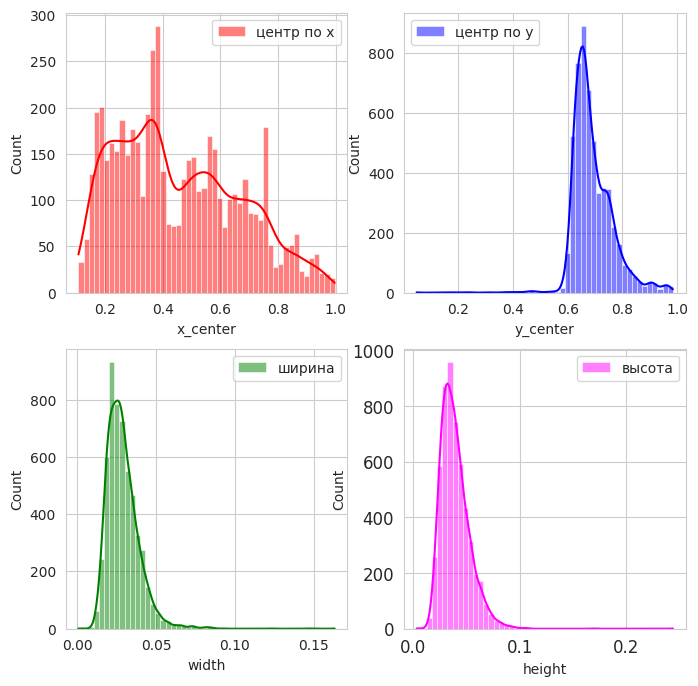

In [15]:
sns.set_style('whitegrid')
plt.figure()
fig, ax = plt.subplots(2, 2, figsize=(8, 8))

sns.histplot(label_df["x_center"], kde=True, bins=50, color="red", ax=ax[0, 0], label='центр по х')
sns.histplot(label_df["y_center"], kde=True, bins=50, color="blue", ax=ax[0, 1], label='центр по у')
sns.histplot(label_df["width"], kde=True, bins=50, color="green", ax=ax[1, 0], label='ширина')
sns.histplot(label_df["height"], kde=True, bins=50, color="magenta", ax=ax[1, 1], label='высота')

ax[0, 0].legend()
ax[0, 1].legend()
ax[1, 0].legend()
ax[1, 1].legend()

locs, labels = plt.xticks()
plt.tick_params(axis='both', which='major', labelsize=12)

plt.show()


Видно, что объекты (в будующем просто - чайки) распологаются внизу изображений и примерно одного размера, что логично из того, что у нас изображения одного и тогоже места, а чайки поодали под окном. Помторим на исключения.

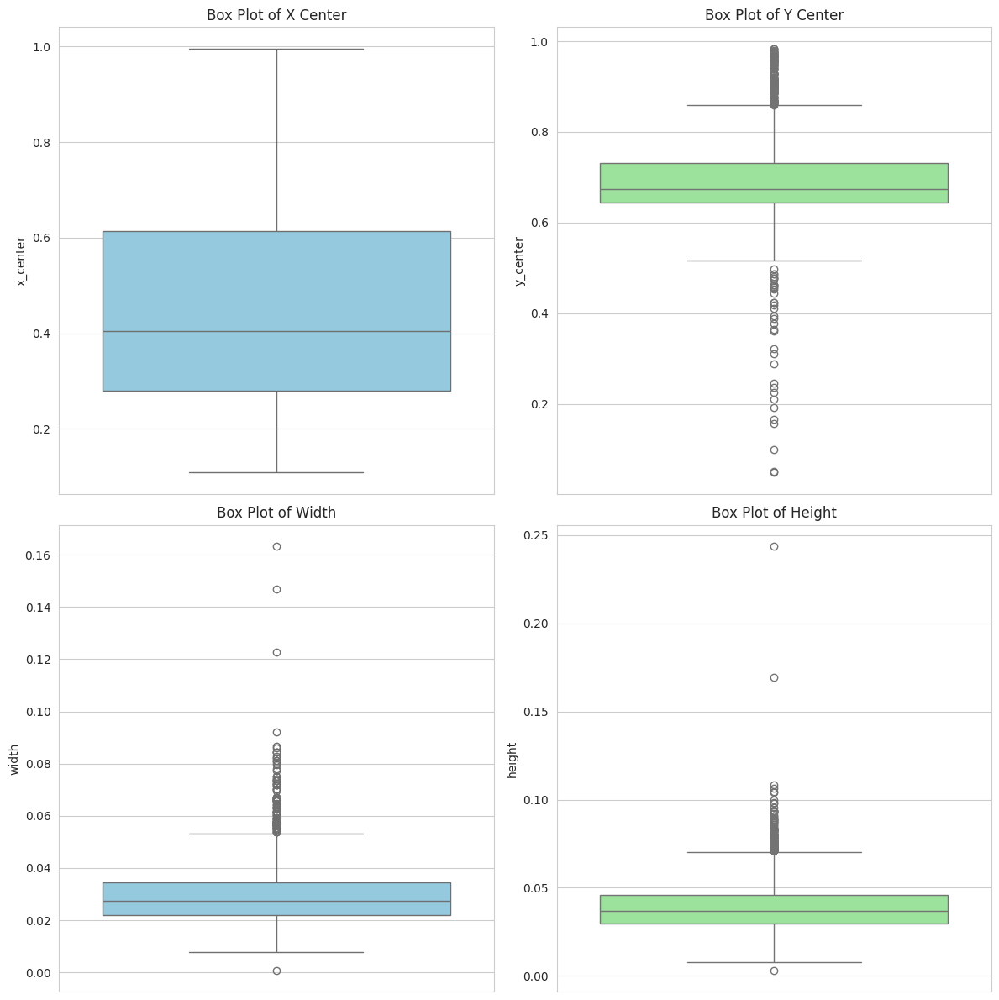

In [16]:
plt.figure(figsize=(12, 12))

plt.subplot(2, 2, 1)
sns.boxplot(y=label_df["x_center"], color='skyblue')
plt.title('Box Plot of X Center')

plt.subplot(2, 2, 2)
sns.boxplot(y=label_df["y_center"], color='lightgreen')
plt.title('Box Plot of Y Center')

plt.subplot(2, 2, 3)
sns.boxplot(y=label_df["width"], color='skyblue')
plt.title('Box Plot of Width')

plt.subplot(2, 2, 4)
sns.boxplot(y=label_df["height"], color='lightgreen')
plt.title('Box Plot of Height')

plt.tight_layout()
plt.show()

Выглядит интересно. По x исключений нет, по y все хаотично, а из размеров двух чаех можно догадаться, что они сели прям у окна.

Но в общем можно ожидать хорошую обучаемость нейронной сети. Приступим.

## 2. Подготовить данные для обучения

- Создать тренировочную и тестовую подвыборки для обучения и тестирования работы моделей
- Создать класс на фреймворке `PyTorch` для создания датасета
- Создать `loader` для передачи данных в модель нейронной сети

*P.s.: если вам удобнее использовать Keras или другой формат обработки данных и построения моделей, вы можете их использовать, не обязательно идти по пути `PyTorch` и `loader`.

Возможно вам это поможет: https://docs.ultralytics.com/datasets/detect/#ultralytics-yolo-format

In [17]:
def dynamic_split(split_ratio=0.8) -> None:
    import os
    import random
    from sklearn.model_selection import train_test_split
    import shutil

    # Config
    data_root = "where-are-the-seagulls/data"
    all_data_dir = os.path.join(data_root, "all_data/")
    train_dir = os.path.join(data_root, "train/")
    val_dir = os.path.join(data_root, "val/")
    test_dir = os.path.join(data_root, "test/")

    # Create new dirs with proper structure
    shutil.rmtree(train_dir, ignore_errors=True)
    shutil.rmtree(val_dir, ignore_errors=True)
    os.makedirs(os.path.join(train_dir, "images"))
    os.makedirs(os.path.join(train_dir, "labels"))
    os.makedirs(os.path.join(val_dir, "images"))
    os.makedirs(os.path.join(val_dir, "labels"))

    # List all images (only .jpg files)
    image_dir = os.path.join(all_data_dir, "images")
    all_images = [f for f in os.listdir(image_dir) if f.endswith('.jpg')]
    random.shuffle(all_images)

    # Split data
    train_files, val_files = train_test_split(
        all_images, 
        train_size=split_ratio,
        random_state=random.randint(0, 1000)
    )

    # Corrected file copying function
    def link_files(file_list, target_dir):
        for img_file in file_list:
            # Copy image
            src_img = os.path.join(all_data_dir, "images", img_file)
            dst_img = os.path.join(target_dir, "images", img_file)
            shutil.copy(src_img, dst_img)
            
            # Copy corresponding label
            label_file = img_file.replace(".jpg", ".txt")
            src_label = os.path.join(all_data_dir, "labels", label_file)  # FIX 1: Correct source path
            dst_label = os.path.join(target_dir, "labels", label_file)   # FIX 2: Correct destination path
            shutil.copy(src_label, dst_label)

    link_files(train_files, train_dir)
    link_files(val_files, val_dir)

In [18]:
dynamic_split()

## 3. Реализация модели

- создать класс для модели
- создать функцию для обучения модели
- создать функцию для валидации модели

In [19]:
from ultralytics import YOLO

# Load a pretrained YOLO model (recommended for training)
model = YOLO("yolo11x.pt")

# Train the model using the 'coco8.yaml' dataset for 3 epochs
results = model.train(data="dataset.yaml", epochs=100)

# Evaluate the model's performance on the validation set
results = model.val()

100%|██████████| 109M/109M [04:25<00:00, 433kB/s]  


Ultralytics 8.3.162 🚀 Python-3.12.3 torch-2.7.1+cu126 CUDA:0 (NVIDIA GeForce RTX 4090, 24081MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=dataset.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=100, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11x.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train16, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, plots=True, pose=12.0, pretraine

train: Scanning /home/andredon/projects/ADA/Homework_final/where-are-the-seagulls/data/train/labels... 400 images, 27 backgrounds, 0 corrupt: 100%|██████████| 400/400 [00:00<00:00, 9450.41it/s]

train: /home/andredon/projects/ADA/Homework_final/where-are-the-seagulls/data/train/images/20200816_180222_01_JPG.rf.5f3bc87ff01f17b2a00c3ecf18d14ac5.jpg: 2 duplicate labels removed
train: /home/andredon/projects/ADA/Homework_final/where-are-the-seagulls/data/train/images/20200819_182328_01_JPG.rf.cca24be539aa73a24a2bf112ab67fe68.jpg: 3 duplicate labels removed
train: /home/andredon/projects/ADA/Homework_final/where-are-the-seagulls/data/train/images/20200910_185837_01_JPG.rf.cdf85cd8e98797d94fb93d972d58fc5f.jpg: 1 duplicate labels removed
train: /home/andredon/projects/ADA/Homework_final/where-are-the-seagulls/data/train/images/20200913_121758_01_JPG.rf.126b4bd798cd834f2c08f1c85a6fee70.jpg: 1 duplicate labels removed
train: /home/andredon/projects/ADA/Homework_final/where-are-the-seagulls/data/train/images/20200913_171925_01_JPG.rf.de1d151832416a3f2df30dcdbf84bf8a.jpg: 3 duplicate labels removed
train: /home/andredon/projects/ADA/Homework_final/where-are-the-seagulls/data/train/images

val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 3505.6±1485.3 MB/s, size: 62.0 KB)


val: Scanning /home/andredon/projects/ADA/Homework_final/where-are-the-seagulls/data/val/labels... 100 images, 5 backgrounds, 0 corrupt: 100%|██████████| 100/100 [00:00<00:00, 6618.75it/s]

val: New cache created: /home/andredon/projects/ADA/Homework_final/where-are-the-seagulls/data/val/labels.cache


Plotting labels to /home/andredon/projects/ADA/runs/detect/train16/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 167 weight(decay=0.0), 174 weight(decay=0.0005), 173 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to /home/andredon/projects/ADA/runs/detect/train16
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100      14.8G      2.413       3.77       1.27        284        640: 100%|██████████| 25/25 [00:05<00:00,  4.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  6.94it/s]

                   all        100       1142          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100      15.5G       2.41      1.797      1.238        257        640: 100%|██████████| 25/25 [00:05<00:00,  4.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  8.62it/s]

                   all        100       1142          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100      15.7G      2.303      1.491      1.227        262        640: 100%|██████████| 25/25 [00:05<00:00,  4.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  8.53it/s]

                   all        100       1142          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100      15.5G      2.395      1.522      1.202        196        640: 100%|██████████| 25/25 [00:05<00:00,  4.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  8.51it/s]

                   all        100       1142          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100      15.5G      2.295      1.471      1.178        314        640: 100%|██████████| 25/25 [00:05<00:00,  4.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  8.55it/s]

                   all        100       1142          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100      15.6G      2.277      1.391      1.162        270        640: 100%|██████████| 25/25 [00:05<00:00,  4.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  7.95it/s]

                   all        100       1142      0.527      0.215      0.213     0.0871



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100      15.6G      2.247      1.325      1.143        272        640: 100%|██████████| 25/25 [00:05<00:00,  4.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  7.38it/s]

                   all        100       1142      0.649      0.546      0.578      0.218



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100      15.6G      2.123      1.308      1.138        295        640: 100%|██████████| 25/25 [00:05<00:00,  4.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  7.74it/s]

                   all        100       1142      0.593       0.44      0.441      0.149



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100      15.4G      2.168       1.33      1.144        220        640: 100%|██████████| 25/25 [00:05<00:00,  4.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  8.54it/s]

                   all        100       1142       0.12      0.028     0.0306     0.0102



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100      15.7G      2.078      1.207       1.13        259        640: 100%|██████████| 25/25 [00:05<00:00,  4.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  7.27it/s]

                   all        100       1142      0.295       0.26      0.152     0.0362



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100      15.7G      2.091      1.175      1.106        197        640: 100%|██████████| 25/25 [00:05<00:00,  4.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  7.17it/s]


                   all        100       1142      0.566      0.553      0.517      0.189

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100      15.7G       2.14      1.225      1.106        242        640: 100%|██████████| 25/25 [00:05<00:00,  4.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  7.43it/s]

                   all        100       1142       0.71      0.599      0.649      0.265



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100      15.4G      2.103      1.227      1.125        221        640: 100%|██████████| 25/25 [00:05<00:00,  4.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  8.20it/s]

                   all        100       1142      0.531      0.227      0.245      0.096



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100      15.6G       2.05      1.173      1.103        252        640: 100%|██████████| 25/25 [00:05<00:00,  4.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  7.25it/s]

                   all        100       1142      0.749      0.643      0.702      0.289



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100      15.6G      2.018      1.139      1.097        153        640: 100%|██████████| 25/25 [00:05<00:00,  4.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  7.60it/s]

                   all        100       1142      0.625       0.56      0.569      0.194



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100      15.7G      2.045      1.163      1.111        236        640: 100%|██████████| 25/25 [00:05<00:00,  4.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  7.59it/s]

                   all        100       1142      0.627       0.54      0.559      0.194



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100      15.5G      2.011       1.12      1.078        221        640: 100%|██████████| 25/25 [00:05<00:00,  4.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  7.62it/s]

                   all        100       1142      0.766      0.689      0.744      0.305



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100      15.7G      1.974      1.098      1.082        259        640: 100%|██████████| 25/25 [00:05<00:00,  4.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  7.67it/s]

                   all        100       1142      0.788      0.632      0.709      0.299



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100      15.6G      1.984      1.122      1.081        183        640: 100%|██████████| 25/25 [00:05<00:00,  4.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  7.68it/s]

                   all        100       1142       0.75      0.599      0.679      0.259



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100      15.7G      1.971      1.081      1.082        137        640: 100%|██████████| 25/25 [00:05<00:00,  4.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  7.59it/s]

                   all        100       1142      0.765      0.652      0.723      0.293



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100      15.5G      1.963      1.077      1.059        205        640: 100%|██████████| 25/25 [00:05<00:00,  4.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  7.58it/s]

                   all        100       1142      0.657      0.628      0.632       0.23



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100      15.7G      1.943      1.043       1.08        194        640: 100%|██████████| 25/25 [00:05<00:00,  4.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  7.59it/s]

                   all        100       1142      0.781      0.705      0.758      0.304



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100      15.7G      1.931      1.049      1.073        275        640: 100%|██████████| 25/25 [00:05<00:00,  4.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  7.61it/s]

                   all        100       1142      0.776      0.668      0.759      0.321



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100      15.7G      1.957      1.049      1.078        216        640: 100%|██████████| 25/25 [00:05<00:00,  4.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  7.65it/s]

                   all        100       1142      0.753      0.666      0.722      0.277



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100      15.5G      1.919      1.042      1.056        189        640: 100%|██████████| 25/25 [00:05<00:00,  4.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  7.68it/s]

                   all        100       1142      0.769      0.683      0.734      0.303



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100      15.6G      1.893      1.006      1.055        242        640: 100%|██████████| 25/25 [00:05<00:00,  4.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  7.69it/s]

                   all        100       1142      0.835        0.7      0.783       0.34



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100      15.6G      1.896      1.001      1.043        256        640: 100%|██████████| 25/25 [00:05<00:00,  4.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  7.69it/s]

                   all        100       1142      0.781      0.687      0.749      0.308



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100      15.6G      1.881     0.9837       1.06        213        640: 100%|██████████| 25/25 [00:05<00:00,  4.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  7.70it/s]

                   all        100       1142      0.744      0.609      0.687      0.279



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100      15.4G      1.885     0.9881      1.049        174        640: 100%|██████████| 25/25 [00:05<00:00,  4.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  7.72it/s]

                   all        100       1142      0.761       0.64      0.707      0.277



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100      15.7G      1.905     0.9896      1.055        378        640: 100%|██████████| 25/25 [00:05<00:00,  4.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  7.68it/s]

                   all        100       1142      0.766      0.673      0.738        0.3



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100      15.6G      1.892      1.016      1.061        231        640: 100%|██████████| 25/25 [00:05<00:00,  4.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  7.68it/s]

                   all        100       1142      0.808      0.724        0.8      0.348



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100      15.7G      1.895      0.987      1.049        229        640: 100%|██████████| 25/25 [00:05<00:00,  4.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  7.68it/s]

                   all        100       1142       0.79      0.673       0.75      0.323



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100      15.5G      1.871     0.9807       1.06        319        640: 100%|██████████| 25/25 [00:05<00:00,  4.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  7.67it/s]

                   all        100       1142      0.774      0.711       0.76      0.312



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100      15.7G      1.856     0.9649      1.034        289        640: 100%|██████████| 25/25 [00:05<00:00,  4.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  7.72it/s]

                   all        100       1142      0.791      0.706      0.768      0.307



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100      15.6G      1.824     0.9377      1.027        308        640: 100%|██████████| 25/25 [00:05<00:00,  4.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  7.74it/s]

                   all        100       1142      0.789      0.722      0.784      0.321



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100      15.7G      1.826     0.9605      1.032        124        640: 100%|██████████| 25/25 [00:05<00:00,  4.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  7.71it/s]

                   all        100       1142      0.838      0.731      0.826      0.363



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100      15.5G      1.815     0.9525      1.041        228        640: 100%|██████████| 25/25 [00:05<00:00,  4.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  7.72it/s]

                   all        100       1142       0.83      0.726      0.811      0.348



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100      15.7G      1.822     0.9459      1.026        321        640: 100%|██████████| 25/25 [00:05<00:00,  4.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  7.69it/s]

                   all        100       1142      0.863      0.729      0.826       0.38



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100      15.7G      1.799     0.9634      1.018        209        640: 100%|██████████| 25/25 [00:05<00:00,  4.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  7.70it/s]

                   all        100       1142      0.818      0.742      0.824      0.353



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100      15.6G      1.843     0.9679      1.029        264        640: 100%|██████████| 25/25 [00:05<00:00,  4.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  7.74it/s]

                   all        100       1142      0.871      0.711      0.825      0.383



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100      15.4G      1.779     0.9179       1.02        273        640: 100%|██████████| 25/25 [00:05<00:00,  4.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  7.68it/s]

                   all        100       1142      0.848      0.763      0.848      0.381



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100      15.6G       1.83     0.9328       1.02        193        640: 100%|██████████| 25/25 [00:05<00:00,  4.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  7.77it/s]

                   all        100       1142      0.866      0.715      0.811      0.368



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100      15.7G      1.805      0.932      1.022        158        640: 100%|██████████| 25/25 [00:05<00:00,  4.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  7.76it/s]

                   all        100       1142      0.848       0.77      0.852      0.393



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100      15.7G       1.77     0.9026      1.022        220        640: 100%|██████████| 25/25 [00:05<00:00,  4.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  7.74it/s]

                   all        100       1142      0.846      0.738       0.84      0.388



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100      15.5G      1.786     0.8844      1.016        212        640: 100%|██████████| 25/25 [00:05<00:00,  4.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  7.74it/s]

                   all        100       1142      0.818       0.73      0.807      0.346



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100      15.8G      1.784     0.9033      1.021        190        640: 100%|██████████| 25/25 [00:05<00:00,  4.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  7.72it/s]

                   all        100       1142      0.834      0.743      0.825      0.358



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100      15.7G      1.753     0.8796      1.031        224        640: 100%|██████████| 25/25 [00:05<00:00,  4.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  7.72it/s]

                   all        100       1142      0.864      0.752      0.843      0.398



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100      15.7G      1.777     0.8865      1.028        141        640: 100%|██████████| 25/25 [00:05<00:00,  4.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  7.70it/s]

                   all        100       1142      0.883       0.76      0.851      0.395



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100      15.4G      1.733      0.866      1.017        171        640: 100%|██████████| 25/25 [00:05<00:00,  4.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  7.74it/s]

                   all        100       1142      0.829      0.741      0.821      0.359



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100      15.7G      1.765     0.8872      1.016        173        640: 100%|██████████| 25/25 [00:05<00:00,  4.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  7.71it/s]

                   all        100       1142      0.802      0.768      0.827      0.386



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100      15.7G      1.776     0.8875      1.014        258        640: 100%|██████████| 25/25 [00:05<00:00,  4.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  7.74it/s]

                   all        100       1142      0.856      0.783      0.853      0.401



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100      15.6G      1.767     0.8759      1.016        179        640: 100%|██████████| 25/25 [00:05<00:00,  4.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  7.70it/s]

                   all        100       1142      0.852      0.736      0.826      0.371



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100      15.4G      1.727     0.8817      1.006        215        640: 100%|██████████| 25/25 [00:05<00:00,  4.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  7.74it/s]

                   all        100       1142      0.836      0.737      0.825      0.355



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100      15.6G      1.708     0.8445      1.007        313        640: 100%|██████████| 25/25 [00:05<00:00,  4.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  7.72it/s]

                   all        100       1142      0.843       0.77      0.843       0.38



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100      15.8G      1.712      0.838     0.9974        171        640: 100%|██████████| 25/25 [00:05<00:00,  4.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  7.74it/s]

                   all        100       1142      0.855       0.76      0.841      0.376



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100      15.7G      1.732     0.8392      1.005        174        640: 100%|██████████| 25/25 [00:05<00:00,  4.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  7.73it/s]

                   all        100       1142      0.881      0.757      0.852      0.398



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100      15.5G      1.714     0.8444      1.017        224        640: 100%|██████████| 25/25 [00:05<00:00,  4.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  7.73it/s]

                   all        100       1142      0.895      0.773      0.861      0.401



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100      15.6G      1.707     0.8361      1.011        227        640: 100%|██████████| 25/25 [00:05<00:00,  4.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  7.74it/s]

                   all        100       1142      0.804      0.742      0.808       0.34



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100      15.6G      1.731     0.8343     0.9999        276        640: 100%|██████████| 25/25 [00:05<00:00,  4.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  7.76it/s]

                   all        100       1142      0.857      0.722      0.821      0.358



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100      15.6G      1.698     0.8161      1.007        217        640: 100%|██████████| 25/25 [00:05<00:00,  4.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  7.76it/s]

                   all        100       1142      0.845      0.741      0.834      0.378



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/100      15.4G      1.666     0.8176     0.9889        251        640: 100%|██████████| 25/25 [00:05<00:00,  4.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  7.73it/s]

                   all        100       1142      0.879      0.787      0.864      0.407



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/100      15.7G      1.674     0.8083     0.9938        220        640: 100%|██████████| 25/25 [00:05<00:00,  4.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  7.76it/s]

                   all        100       1142      0.856       0.78      0.852      0.395



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/100      15.7G      1.661     0.7984     0.9926        156        640: 100%|██████████| 25/25 [00:05<00:00,  4.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  7.74it/s]

                   all        100       1142       0.85      0.739      0.834      0.368



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/100      15.7G      1.705     0.8187      0.995        264        640: 100%|██████████| 25/25 [00:05<00:00,  4.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  7.71it/s]

                   all        100       1142      0.866      0.792      0.866      0.396



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/100      15.4G      1.648     0.8034     0.9789        274        640: 100%|██████████| 25/25 [00:05<00:00,  4.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  7.80it/s]

                   all        100       1142      0.873      0.777      0.857      0.402



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/100      15.7G      1.661     0.8036     0.9971        208        640: 100%|██████████| 25/25 [00:05<00:00,  4.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  7.80it/s]

                   all        100       1142       0.86      0.785      0.854      0.404



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/100      15.6G      1.667     0.8067     0.9937        289        640: 100%|██████████| 25/25 [00:05<00:00,  4.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  7.78it/s]

                   all        100       1142      0.846      0.784      0.854        0.4



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/100      15.7G      1.652      0.803     0.9851        185        640: 100%|██████████| 25/25 [00:05<00:00,  4.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  7.72it/s]

                   all        100       1142      0.876      0.783      0.856      0.415



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/100      15.4G      1.656     0.7838     0.9869        190        640: 100%|██████████| 25/25 [00:05<00:00,  4.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  7.75it/s]

                   all        100       1142      0.876      0.802      0.865      0.414



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/100      15.7G       1.64     0.7884     0.9808        279        640: 100%|██████████| 25/25 [00:05<00:00,  4.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  7.80it/s]

                   all        100       1142      0.876       0.79       0.86      0.411



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/100      15.7G      1.635     0.7687     0.9892        206        640: 100%|██████████| 25/25 [00:05<00:00,  4.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  7.80it/s]

                   all        100       1142      0.881      0.779      0.858      0.405



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/100      15.6G      1.645     0.7851     0.9903        177        640: 100%|██████████| 25/25 [00:05<00:00,  4.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  7.73it/s]

                   all        100       1142      0.869      0.775      0.857      0.399



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/100      15.4G      1.603      0.756     0.9731        231        640: 100%|██████████| 25/25 [00:05<00:00,  4.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  7.81it/s]

                   all        100       1142      0.884      0.773       0.86      0.411



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/100      15.6G      1.603     0.7537     0.9646        227        640: 100%|██████████| 25/25 [00:05<00:00,  4.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  7.78it/s]

                   all        100       1142      0.869       0.78      0.863      0.404



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/100      15.7G      1.619      0.766     0.9797        208        640: 100%|██████████| 25/25 [00:05<00:00,  4.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  7.80it/s]

                   all        100       1142      0.872      0.785      0.866      0.415



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/100      15.6G      1.581     0.7443     0.9601        261        640: 100%|██████████| 25/25 [00:05<00:00,  4.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  7.77it/s]

                   all        100       1142      0.871      0.778      0.864        0.4



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/100      15.4G      1.586     0.7331     0.9824        219        640: 100%|██████████| 25/25 [00:05<00:00,  4.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  7.73it/s]

                   all        100       1142      0.885      0.799      0.873      0.399



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/100      15.7G       1.58      0.729     0.9833        308        640: 100%|██████████| 25/25 [00:05<00:00,  4.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  7.78it/s]

                   all        100       1142      0.902      0.778      0.873      0.409



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/100      15.7G      1.565     0.7375     0.9716        277        640: 100%|██████████| 25/25 [00:05<00:00,  4.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  7.78it/s]

                   all        100       1142      0.877       0.79      0.872      0.405



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/100      15.7G      1.577     0.7415     0.9637        193        640: 100%|██████████| 25/25 [00:05<00:00,  4.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  7.70it/s]

                   all        100       1142      0.881      0.803       0.87      0.414



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/100      15.4G      1.559     0.7224       0.97        205        640: 100%|██████████| 25/25 [00:05<00:00,  4.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  7.75it/s]

                   all        100       1142       0.89      0.802      0.877      0.422



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/100      15.7G      1.575     0.7319     0.9681        254        640: 100%|██████████| 25/25 [00:05<00:00,  4.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  7.77it/s]

                   all        100       1142      0.884      0.797      0.873       0.42



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/100      15.7G      1.572     0.7441      0.959        233        640: 100%|██████████| 25/25 [00:05<00:00,  4.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  7.75it/s]

                   all        100       1142      0.881      0.815       0.88      0.407



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/100      15.7G      1.559     0.7171     0.9599        244        640: 100%|██████████| 25/25 [00:05<00:00,  4.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  7.72it/s]

                   all        100       1142      0.878      0.804      0.879      0.417



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/100      15.4G       1.56     0.7196     0.9728        187        640: 100%|██████████| 25/25 [00:05<00:00,  4.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  7.77it/s]

                   all        100       1142      0.882      0.792       0.87      0.417



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/100      15.6G      1.545       0.72     0.9649        139        640: 100%|██████████| 25/25 [00:05<00:00,  4.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  7.77it/s]

                   all        100       1142      0.877      0.808      0.881      0.422



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/100      15.6G      1.557     0.7276     0.9582        130        640: 100%|██████████| 25/25 [00:05<00:00,  4.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  7.78it/s]

                   all        100       1142      0.878      0.809      0.878      0.414



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/100      15.6G      1.543     0.7153     0.9577        285        640: 100%|██████████| 25/25 [00:05<00:00,  4.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  7.83it/s]

                   all        100       1142       0.88      0.804      0.881      0.416



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/100      15.4G      1.546     0.7041     0.9611        266        640: 100%|██████████| 25/25 [00:05<00:00,  4.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  7.79it/s]

                   all        100       1142      0.905      0.797      0.884      0.421



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/100      15.6G      1.505     0.7002     0.9524        318        640: 100%|██████████| 25/25 [00:05<00:00,  4.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  7.77it/s]

                   all        100       1142      0.903      0.792      0.873      0.422


Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/100      15.6G      1.515     0.6881     0.9825        161        640: 100%|██████████| 25/25 [00:05<00:00,  4.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  7.77it/s]

                   all        100       1142       0.88      0.794      0.867      0.412



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/100      15.6G      1.501     0.6788     0.9825        191        640: 100%|██████████| 25/25 [00:05<00:00,  4.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  7.74it/s]

                   all        100       1142      0.903      0.791      0.882      0.425



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/100      15.4G      1.495     0.6907     0.9781        206        640: 100%|██████████| 25/25 [00:05<00:00,  4.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  7.81it/s]

                   all        100       1142      0.892       0.81      0.884      0.411



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/100      15.6G      1.491     0.6687     0.9776        149        640: 100%|██████████| 25/25 [00:05<00:00,  4.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  7.79it/s]

                   all        100       1142      0.887      0.786      0.878      0.421



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/100      15.7G      1.477     0.6645     0.9613        180        640: 100%|██████████| 25/25 [00:05<00:00,  4.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  7.78it/s]

                   all        100       1142      0.872      0.808      0.881      0.417



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/100      15.7G      1.453     0.6649     0.9691        172        640: 100%|██████████| 25/25 [00:05<00:00,  4.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  7.73it/s]

                   all        100       1142      0.866      0.819      0.879      0.419



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/100      15.4G      1.468     0.6508     0.9766        150        640: 100%|██████████| 25/25 [00:05<00:00,  4.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  7.80it/s]

                   all        100       1142      0.887      0.814      0.885      0.416



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/100      15.6G      1.464     0.6515     0.9656        210        640: 100%|██████████| 25/25 [00:05<00:00,  4.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  7.81it/s]

                   all        100       1142      0.891       0.81      0.885      0.421



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/100      15.6G      1.448     0.6423     0.9652        127        640: 100%|██████████| 25/25 [00:05<00:00,  4.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  7.82it/s]

                   all        100       1142      0.899      0.806      0.885       0.42



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/100      15.6G      1.471     0.6545     0.9822        102        640: 100%|██████████| 25/25 [00:05<00:00,  4.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  7.85it/s]

                   all        100       1142      0.903       0.81      0.887       0.42



100 epochs completed in 0.188 hours.
Optimizer stripped from /home/andredon/projects/ADA/runs/detect/train16/weights/last.pt, 114.4MB
Optimizer stripped from /home/andredon/projects/ADA/runs/detect/train16/weights/best.pt, 114.4MB

Validating /home/andredon/projects/ADA/runs/detect/train16/weights/best.pt...
Ultralytics 8.3.162 🚀 Python-3.12.3 torch-2.7.1+cu126 CUDA:0 (NVIDIA GeForce RTX 4090, 24081MiB)
YOLO11x summary (fused): 190 layers, 56,828,179 parameters, 0 gradients, 194.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.40it/s]


                   all        100       1142      0.904      0.792      0.883      0.426
Speed: 0.1ms preprocess, 3.8ms inference, 0.0ms loss, 2.7ms postprocess per image
Results saved to /home/andredon/projects/ADA/runs/detect/train16
Ultralytics 8.3.162 🚀 Python-3.12.3 torch-2.7.1+cu126 CUDA:0 (NVIDIA GeForce RTX 4090, 24081MiB)
YOLO11x summary (fused): 190 layers, 56,828,179 parameters, 0 gradients, 194.4 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 5129.8±2460.9 MB/s, size: 46.7 KB)


val: Scanning /home/andredon/projects/ADA/Homework_final/where-are-the-seagulls/data/val/labels.cache... 100 images, 5 backgrounds, 0 corrupt: 100%|██████████| 100/100 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  6.38it/s]


                   all        100       1142      0.906      0.792      0.884      0.424
Speed: 0.6ms preprocess, 6.9ms inference, 0.0ms loss, 1.5ms postprocess per image
Results saved to /home/andredon/projects/ADA/runs/detect/train162


## 4. Обучение модели
*   Определить необходимые параметры для обучения модели (learning rate, optimizer, loss function, etc)
*   Реализовать процесс обучения модели
*   Оценить эффективность работы модели



## 5. Экспериментальная часть

- протестировать не менее 3х разных моделей для решения задачи
- сравнить их эффективность (по метрикам и потерям)
- сделать выводы

In [20]:
results = model.predict("where-are-the-seagulls/data/test/images", save=True, save_txt=True)


image 1/99 /home/andredon/projects/ADA/Homework_final/where-are-the-seagulls/data/test/images/20200928_150507_01_JPG.rf.109359154a680b75a67dce1e82062e55.jpg: 640x640 1 seagulls, 6.9ms
image 2/99 /home/andredon/projects/ADA/Homework_final/where-are-the-seagulls/data/test/images/20200928_160525_01_JPG.rf.50f3289f065a9a4f5372ffa3df9e7265.jpg: 640x640 (no detections), 6.9ms
image 3/99 /home/andredon/projects/ADA/Homework_final/where-are-the-seagulls/data/test/images/20200928_180600_01_JPG.rf.df87e688ee0e009c3a06572a4997cf81.jpg: 640x640 (no detections), 6.9ms
image 4/99 /home/andredon/projects/ADA/Homework_final/where-are-the-seagulls/data/test/images/20200929_081017_01_JPG.rf.c0e8134223d6ed61ac5187cc29495bd9.jpg: 640x640 (no detections), 6.9ms
image 5/99 /home/andredon/projects/ADA/Homework_final/where-are-the-seagulls/data/test/images/20200929_091035_01_JPG.rf.cc0f7b275eb3a5dd680df0011fa46c36.jpg: 640x640 (no detections), 6.9ms
image 6/99 /home/andredon/projects/ADA/Homework_final/where

In [21]:
results

[ultralytics.engine.results.Results object with attributes:
 
 boxes: ultralytics.engine.results.Boxes object
 keypoints: None
 masks: None
 names: {0: 'seagulls'}
 obb: None
 orig_img: array([[[ 80,  77,  72],
         [ 83,  80,  75],
         [ 86,  83,  79],
         ...,
         [190, 179, 171],
         [192, 179, 171],
         [191, 178, 170]],
 
        [[ 80,  77,  72],
         [ 82,  79,  74],
         [ 86,  83,  79],
         ...,
         [192, 181, 173],
         [193, 180, 172],
         [192, 179, 171]],
 
        [[ 80,  77,  72],
         [ 82,  79,  74],
         [ 86,  83,  79],
         ...,
         [193, 182, 174],
         [192, 181, 173],
         [192, 181, 173]],
 
        ...,
 
        [[  0,   0,   0],
         [  0,   0,   0],
         [  0,   0,   0],
         ...,
         [ 29,  50,  48],
         [ 27,  49,  47],
         [ 27,  49,  47]],
 
        [[  0,   0,   0],
         [  0,   0,   0],
         [  0,   0,   0],
         ...,
         [ 32,  

In [28]:
detections = []
for result in results:
    # Extract filename from path
    file_name = os.path.basename(result.path)
    
    # Initialize bbox string
    bbox_str = ""
    
    # Process detections if any exist
    if len(result.boxes) > 0:
        # Get normalized coordinates (xywhn)
        boxes_norm = result.boxes.xywhn.cpu().numpy()
        class_ids = result.boxes.cls.cpu().numpy().astype(int)
        
        # Build bbox string
        box_strings = []
        for i in range(len(boxes_norm)):
            box = boxes_norm[i]
            box_strings.append(f"{class_ids[i]} {box[0]:.2f} {box[1]:.2f} {box[2]:.2f} {box[3]:.2f}")
        bbox_str = " ".join(box_strings)
    else:
        bbox_str = "-1"
    
    detections.append({
        "filename": file_name,
        "bbox": bbox_str
    })

# Create DataFrame
df = pd.DataFrame(detections)


In [29]:
df = df.reset_index()
df

,index,filename,bbox
0,0,20200928_150507_01_JPG.rf.109359154a680b75a67d...,0 0.28 0.66 0.02 0.02
1,1,20200928_160525_01_JPG.rf.50f3289f065a9a4f5372...,-1
2,2,20200928_180600_01_JPG.rf.df87e688ee0e009c3a06...,-1
3,3,20200929_081017_01_JPG.rf.c0e8134223d6ed61ac51...,-1
4,4,20200929_091035_01_JPG.rf.cc0f7b275eb3a5dd680d...,-1
...,...,...,...
94,94,20201011_163823_01_JPG.rf.e2a5508980ce1a7009ec...,-1
95,95,20201011_173839_01_JPG.rf.078741d81a9f4e1427dd...,-1
96,96,20201012_074301_01_JPG.rf.aeea80a57963913c15a9...,-1
97,97,20201012_084317_01_JPG.rf.1628fe9f8845551f938c...,-1


In [30]:
df.to_csv("submission.csv", index=False)

In [32]:
!kaggle competitions submit -c where-are-the-seagulls -f submission.csv -m "Message"

100%|██████████████████████████████████████| 9.18k/9.18k [00:00<00:00, 21.1kB/s]
Successfully submitted to Where are the seagulls?